# 1. Import modules and load MERFISH data 

In [10]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=150, dpi_save=300, frameon=False, figsize=(3,3), fontsize=7.5, facecolor='white')

# 2. Load MERLin analysis results

In [2]:
merlin_output_folder = r'I:\MERFISH_Analysis\20221023-hM1_hM1'
# generate post-analysis folders
postanalysis_folder = os.path.join(merlin_output_folder, 'PostAnalysis')
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Create postanalysis_folder: I:\MERFISH_Analysis\20221023-hM1_hM1\PostAnalysis


In [3]:
figure_folder = os.path.join(postanalysis_folder, 'Figures')
if not os.path.exists(figure_folder):
    print(f"Create figure_folder: {figure_folder}")
    os.makedirs(figure_folder)
else:
    print(f"Use figure_folder: {figure_folder}")

sc.settings.figdir = figure_folder

Create figure_folder: I:\MERFISH_Analysis\20221023-hM1_hM1\PostAnalysis\Figures


## Load metadata

In [4]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,105926040683202353449139245055602350806,0,894.337713,-1955.207949,-3296.303998,-1960.618749,-1949.797149,-3301.714798,-3290.893198
1,122158983551452003883079674591768377013,0,936.638378,-1976.591949,-3219.083996,-1982.110750,-1971.073149,-3225.034796,-3213.133196
2,135528992269581837242917869976241511380,0,888.860065,-1995.275950,-3250.565997,-2001.118750,-1989.433150,-3255.814797,-3245.317197
3,138294325729875439570785458338116857028,0,659.172448,-1964.549949,-3153.263394,-1970.770749,-1958.329149,-3157.102794,-3149.423994
4,153050332019201417345589748654594020445,0,153.969707,-2021.195951,-3158.927995,-2024.554751,-2017.837150,-3162.286795,-3155.569194
...,...,...,...,...,...,...,...,...,...
17003,79099843742491936258328970898953325538,334,101.965877,-1978.871969,-2999.858113,-1981.312769,-1976.431169,-3002.352913,-2997.363313
17004,79558247582644469806885973179662546413,334,272.720780,-1993.559969,-3139.664117,-1998.052770,-1989.067169,-3143.292917,-3136.035316
17005,81073384985453974078350458654119555246,334,332.595945,-1898.087967,-3157.106117,-1902.796767,-1893.379167,-3161.976917,-3152.235317
17006,87859974299395567044559333552616328511,334,1660.801763,-1841.009965,-2948.779512,-1849.012766,-1833.007165,-2955.264912,-2942.294111


In [5]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')

In [6]:
# remove blanks
blanks = [_c for _c in df.columns if 'Blank-' in _c]
df = df.drop(columns=blanks)

adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

df

C:\Users\puzheng_new\AppData\Local\Temp\57\ipykernel_43080\3737320187.py:5: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = anndata.AnnData(df)


,CD52,PTPRU,MARCKSL1,RSPO1,POU3F1,RAB3B,ROR1,PTGER3,SLC44A5,ST6GALNAC5,...,SYNE2,IFI27,CDH11,ZFHX3,VAT1L,EPN2,NPTX1,ZNF536,KIAA1755,PCDH11X
index,,,,,,,,,,,,,,,,,,,,,
105926040683202353449139245055602350806,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
122158983551452003883079674591768377013,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0
135528992269581837242917869976241511380,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
138294325729875439570785458338116857028,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
153050332019201417345589748654594020445,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79099843742491936258328970898953325538,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
79558247582644469806885973179662546413,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
81073384985453974078350458654119555246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [7]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

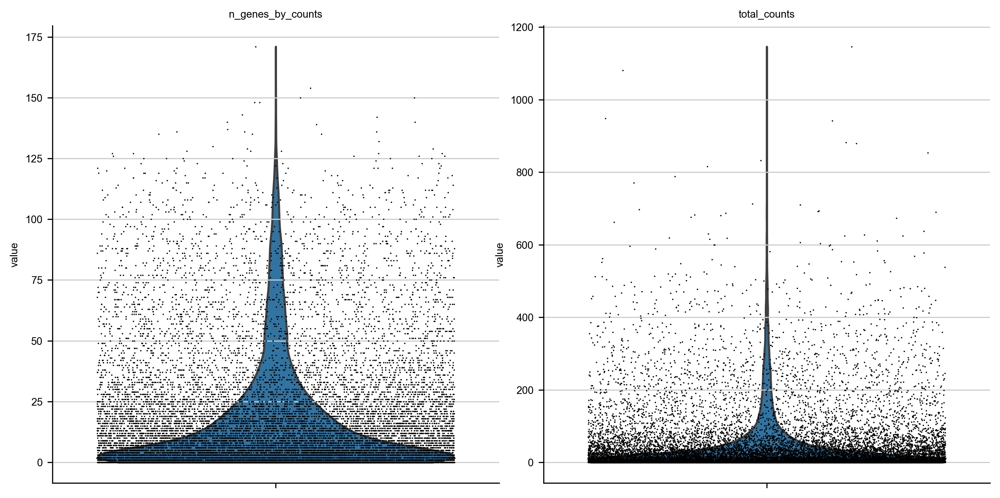

In [11]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

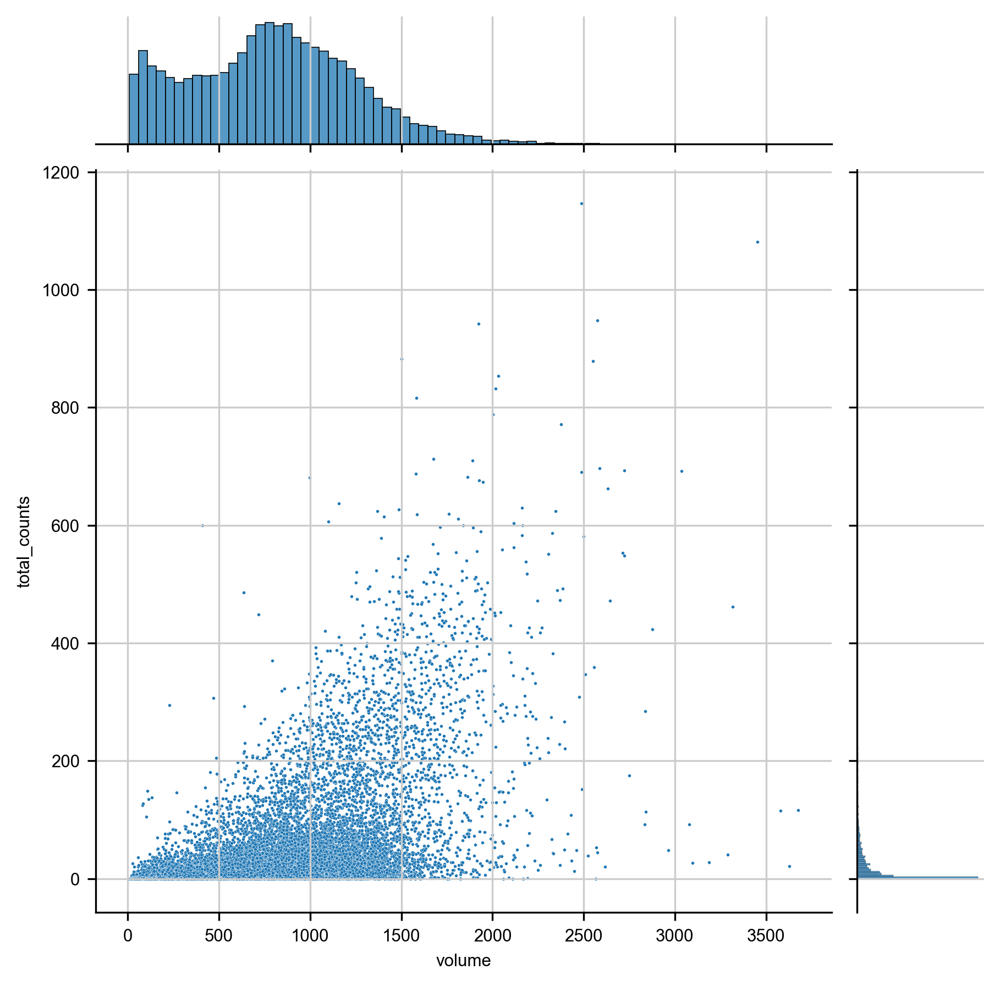

In [12]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts', s=2,)

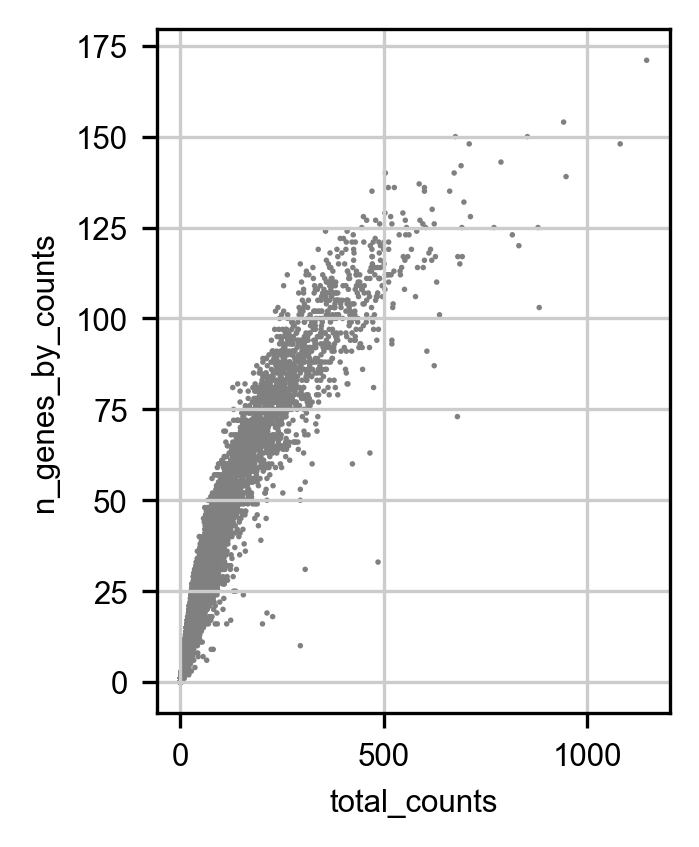

In [14]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [15]:
gene_count_threshold = 10
total_count_threshold = 10
volume_threshold = 200
volume_upper_threshold = 6000
# Filtering
adata = adata[adata.obs['n_genes_by_counts'] > gene_count_threshold]
adata = adata[adata.obs['total_counts'] > total_count_threshold]
adata = adata[adata.obs['volume'] > volume_threshold]
adata = adata[adata.obs['volume'] <= volume_upper_threshold]

print(len(adata) / len(cell_meta_data) , len(adata))

0.4482596425211665 7624


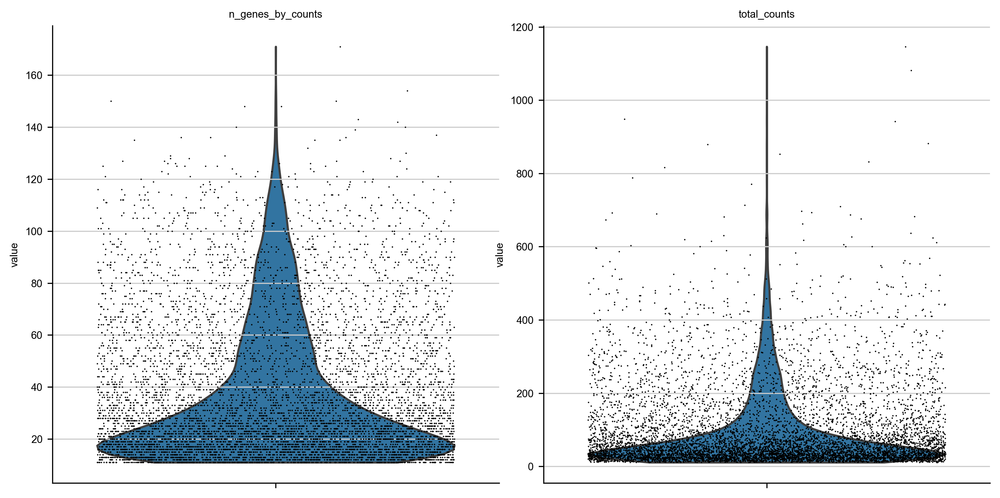

In [16]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True, save='_after_filter_counts.png')

In [17]:
# plot mean count
adata.obs['total_counts'].mean()

95.60125732421875

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


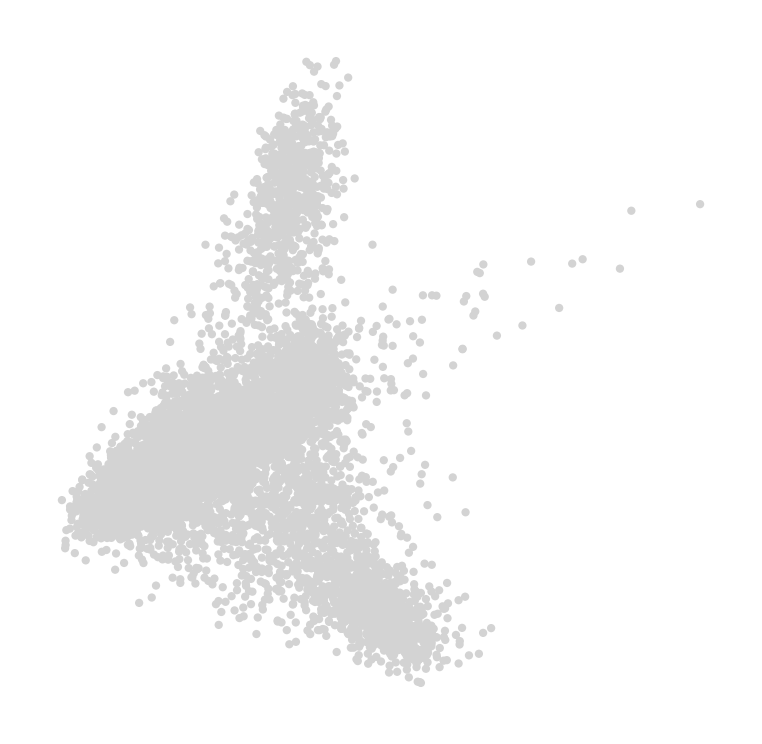

Wall time: 27.8 s


In [18]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [19]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=30)

Wall time: 29.6 s


In [20]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=0.5)

Wall time: 593 ms


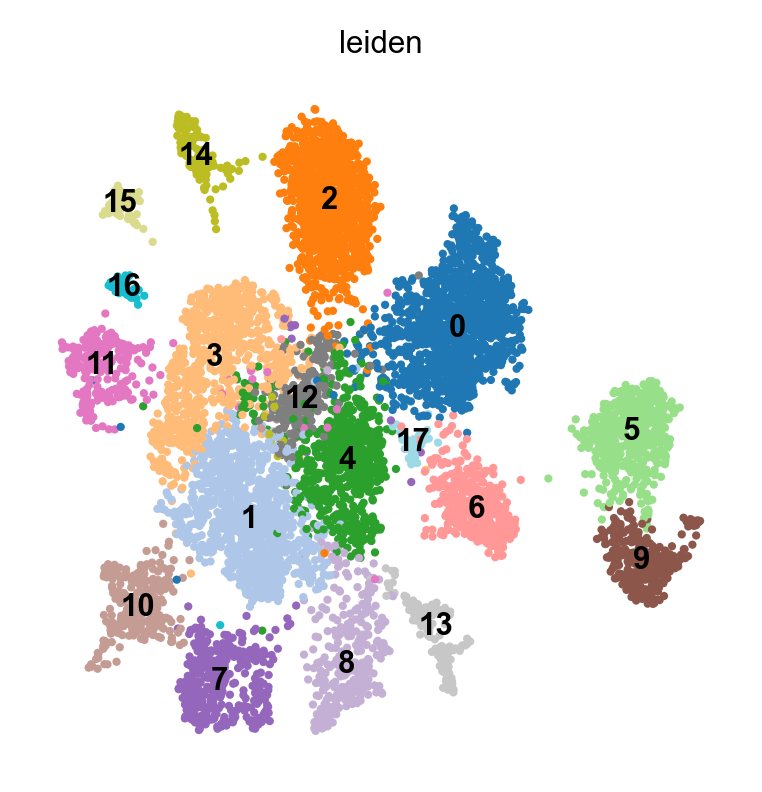

Wall time: 18 s


In [21]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', 
           legend_loc='on data',
           palette='tab20',
           save='_cluster.png',
           )

## 5. Check count for each cell for genes of interest

In [22]:
# direcly use previous leiden
adata.obs['leiden_cluster'] = adata.obs.leiden

## T-test to identify marker genes

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2

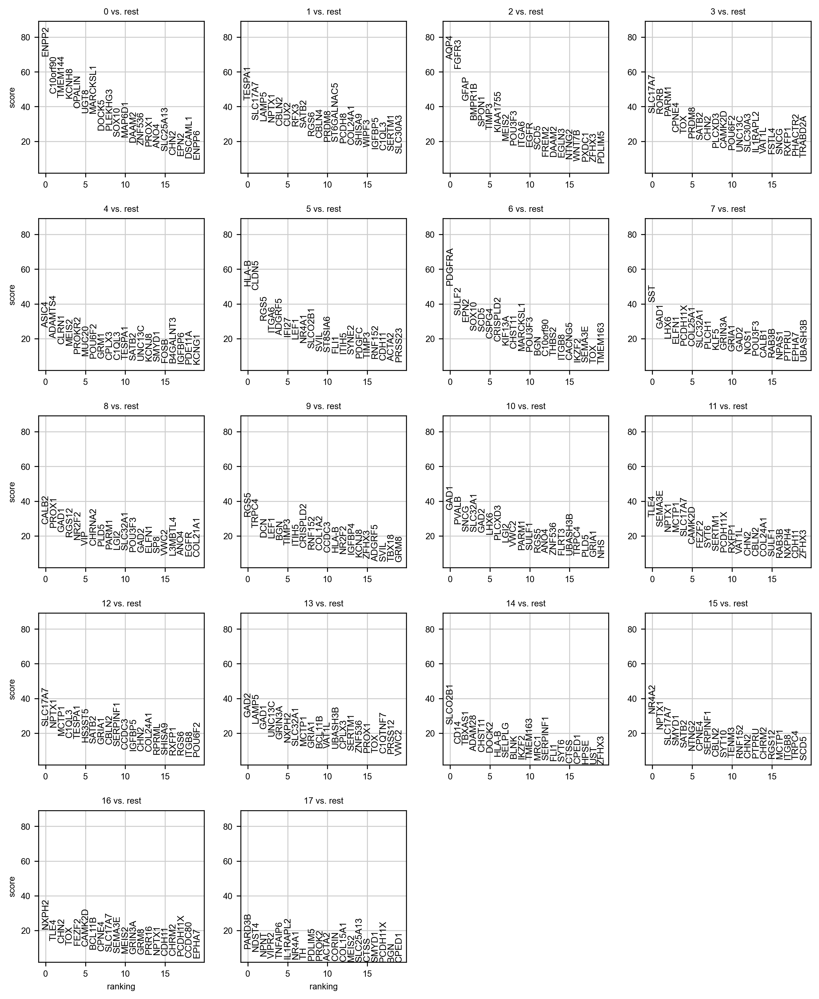

In [23]:
sc.tl.rank_genes_groups(adata, groupby='leiden_cluster', method='t-test')
sc.pl.rank_genes_groups(adata, groupby='leiden_cluster')

In [24]:
gene_ordering = np.array([list(_gnames) for _gnames in adata.uns['rank_genes_groups']['names']])

In [54]:
# assign clusters
clusters = np.sort(np.unique(adata.obs['leiden_cluster']).astype(np.int32))

# Inhibitory
inhibitory_clusters = []
for _i in clusters:
    if np.where(gene_ordering[:,_i]=='SLC32A1')[0] < 20:
        print(_i, end=', ')
        inhibitory_clusters.append(_i)
# excitatory
print("")
excitatory_clusters = []
for _i in clusters:
    if np.where(gene_ordering[:,_i]=='SLC17A7')[0] < 20:
        print(_i, end=', ')
        excitatory_clusters.append(_i)
nonneuron_clusters = []
for _i in clusters:
    if _i not in inhibitory_clusters and _i not in excitatory_clusters:
        nonneuron_clusters.append(_i)

7, 8, 10, 13, 
1, 3, 11, 12, 15, 16, 

In [33]:
gene_ordering[:10, 0]

array(['ENPP2', 'C10orf90', 'TMEM144', 'KCNH8', 'OPALIN', 'UGT8',
       'MARCKSL1', 'DOCK5', 'PLEKHG3', 'SOX10'], dtype='<U10')

In [34]:
gene_ordering[:10, 2]

array(['AQP4', 'FGFR3', 'GFAP', 'BMPR1B', 'SPON1', 'TIMP3', 'KIAA1755',
       'MEIS2', 'POU3F3', 'ITGA6'], dtype='<U10')

In [51]:
gene_ordering[:20, 4]

array(['ASIC4', 'ADAMTS4', 'CLRN1', 'MEIS2', 'PROKR2', 'MUC20', 'POU6F2',
       'GRM1', 'CPLX3', 'C1QL3', 'TESPA1', 'SATB2', 'UNC13C', 'KCNJ8',
       'SMYD1', 'FOSB', 'B4GALNT3', 'IGFBP6', 'PDE11A', 'KCNG1'],
      dtype='<U10')

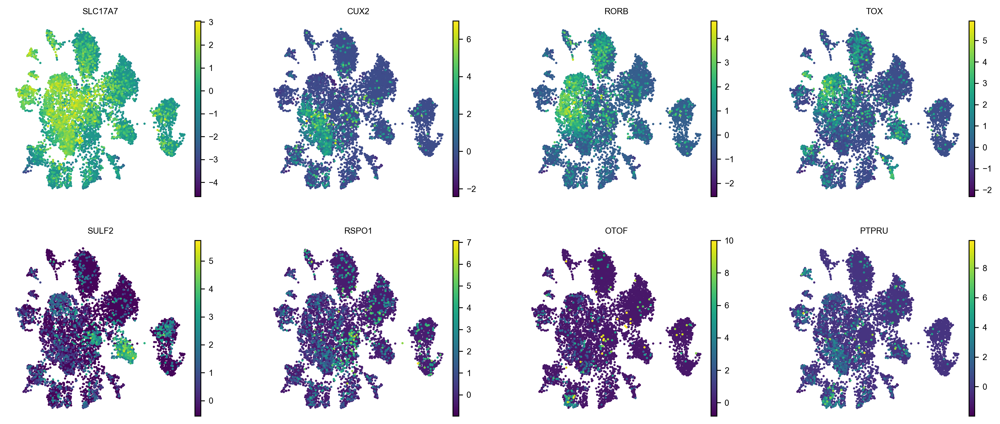

In [35]:
sc.pl.umap(adata, color=['SLC17A7','CUX2','RORB', 'TOX', 'SULF2', 'RSPO1', 'OTOF','PTPRU'])

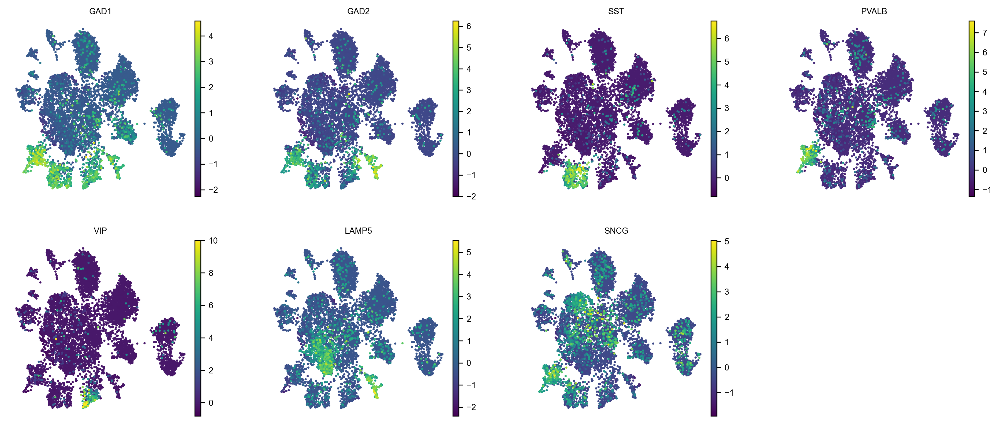

In [36]:
sc.pl.umap(adata, color=['GAD1','GAD2','SST','PVALB','VIP','LAMP5','SNCG'])

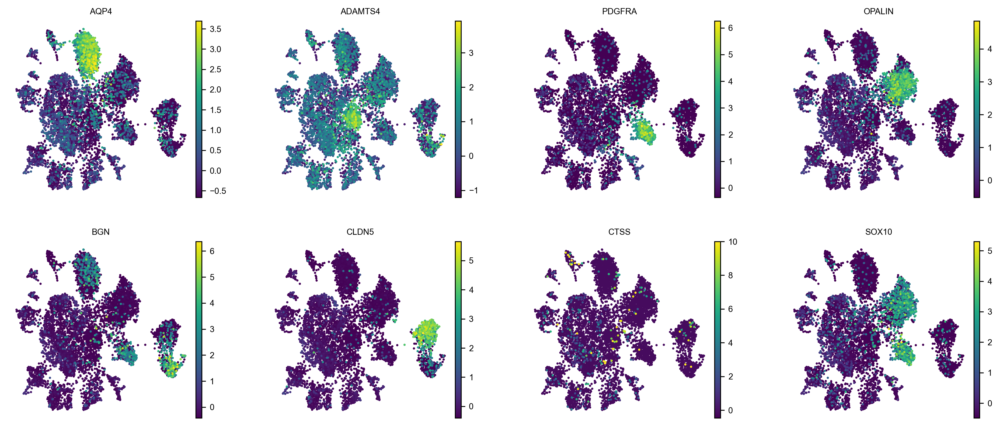

In [37]:
sc.pl.umap(adata, color=['AQP4','ADAMTS4','PDGFRA','OPALIN','BGN','CLDN5', 'CTSS', 'SOX10',])

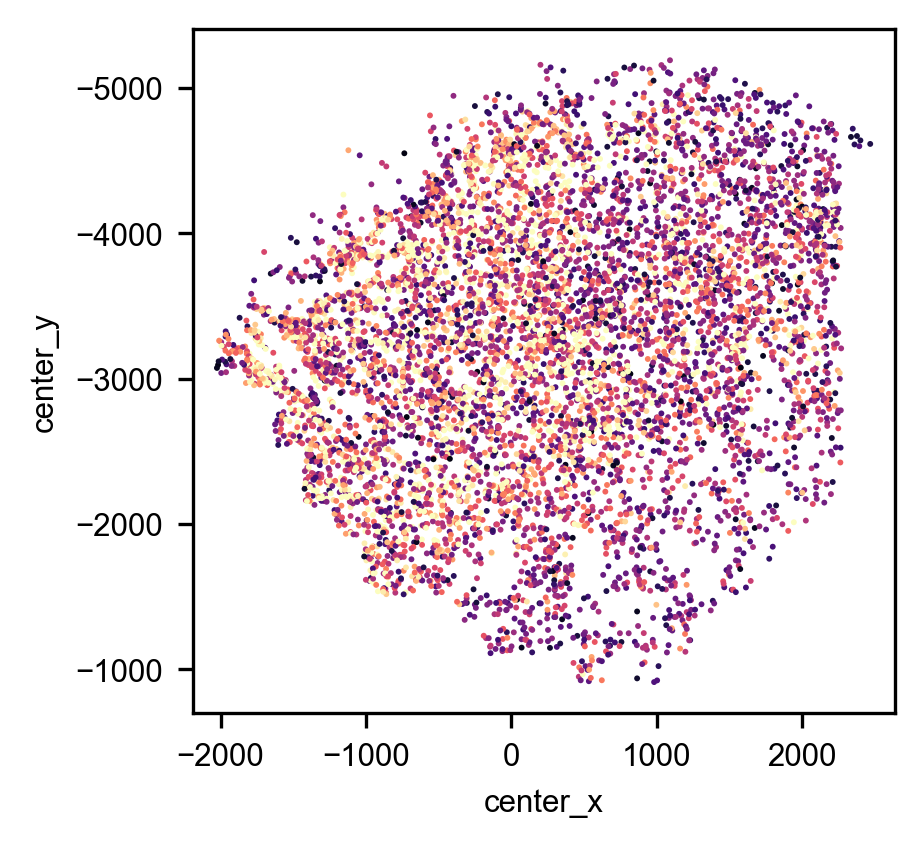

In [60]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
#plt.style.use('dark_background')
ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                     hue='total_counts', hue_norm=LogNorm(vmin=1e1,vmax=200), 
                     palette='magma',
                     s=2, linewidth=0,
                     legend=False, )
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
#ax.legend(hs,ls, ncol=8, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, 'spatial-total_counts.png'), transparent=True)
plt.show()

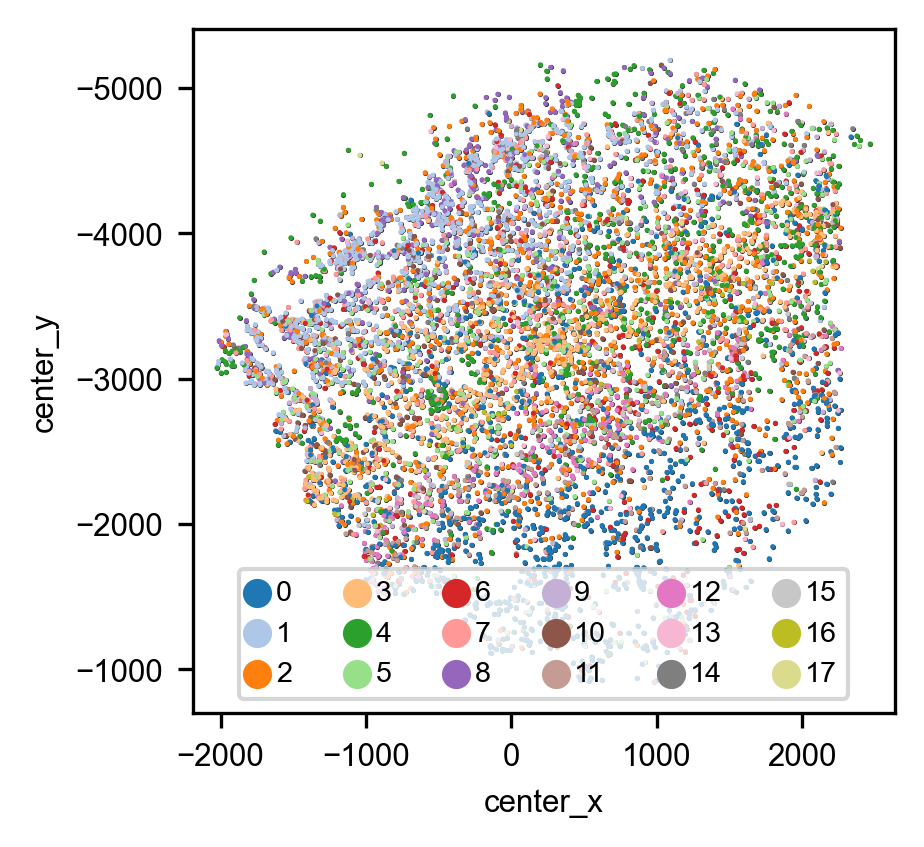

In [62]:
import matplotlib.pyplot as plt
# visualzie the spatial dist for clusters
#sel_clusters = ['0', '1', '2', '3', '4', '5']
sel_clusters = np.unique(adata.obs['leiden'])

sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden']) if _cls in sel_clusters]
ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.2,0.2,0.2], s=1.5, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden', s=1.5, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=6, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, 'spatial-all_clusters.png'), transparent=True)
plt.show()

# 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

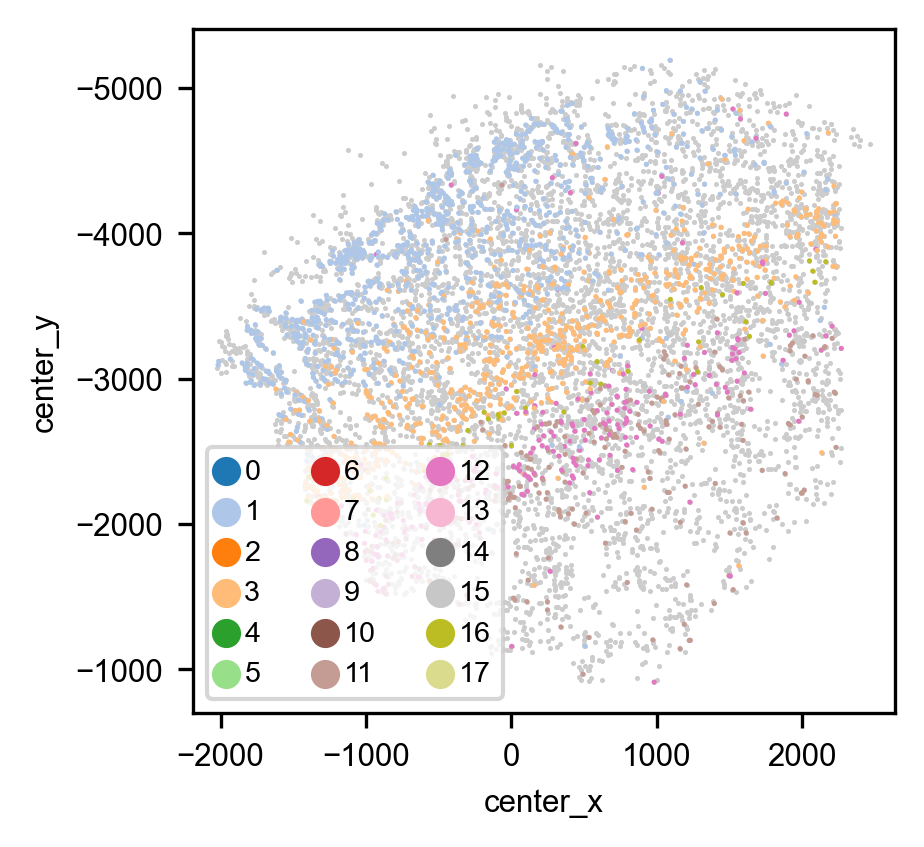

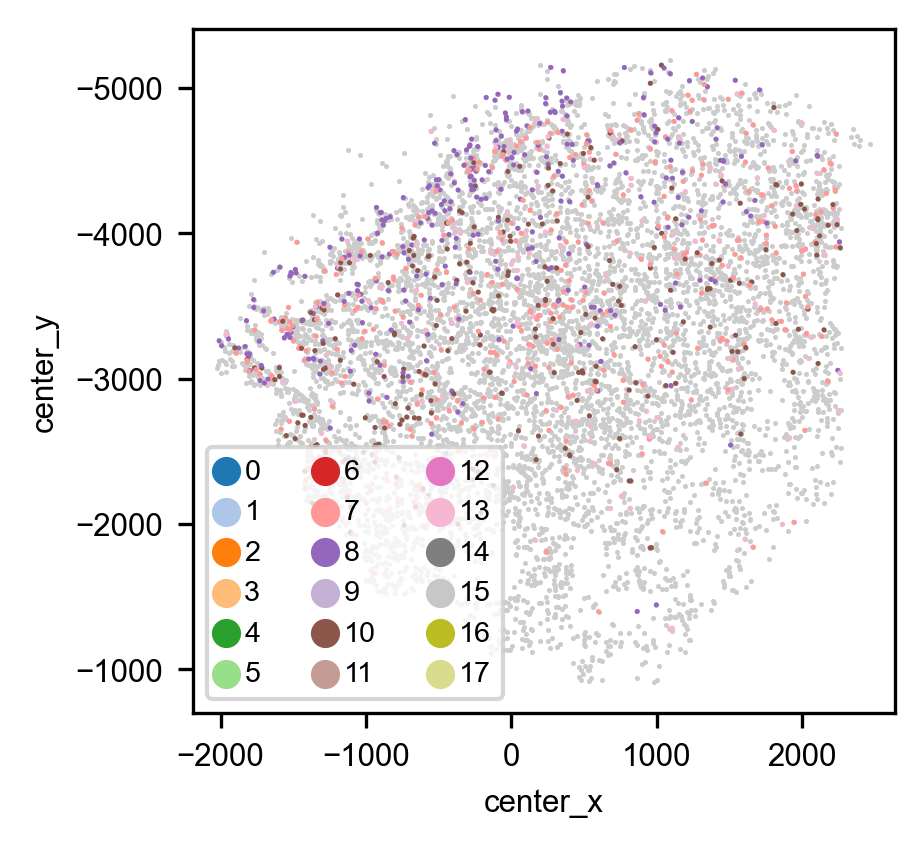

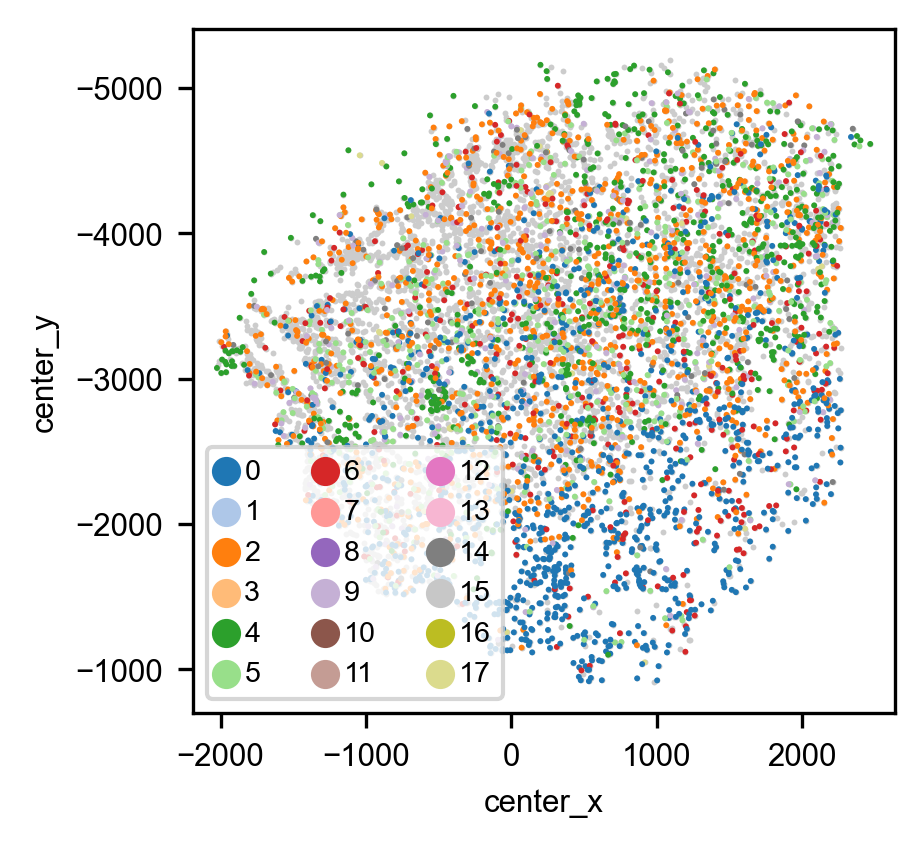

In [48]:
# visualzie the spatial dist for clusters

sel_clusters = [str(_cls) for _cls in excitatory_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.8,0.8,0.8], s=1.5, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=1.5, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=3, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_excitatory_clusters.png'), transparent=True)
plt.show()


sel_clusters = [str(_cls) for _cls in inhibitory_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.8,0.8,0.8], s=1.5, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=1.5, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=3, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_inhibitory_clusters.png'), transparent=True)
plt.show()


sel_clusters = [str(_cls) for _cls in nonneuron_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.8,0.8,0.8], s=2., legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2., legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=3, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_nonneuron_clusters.png'), transparent=True)
plt.show()

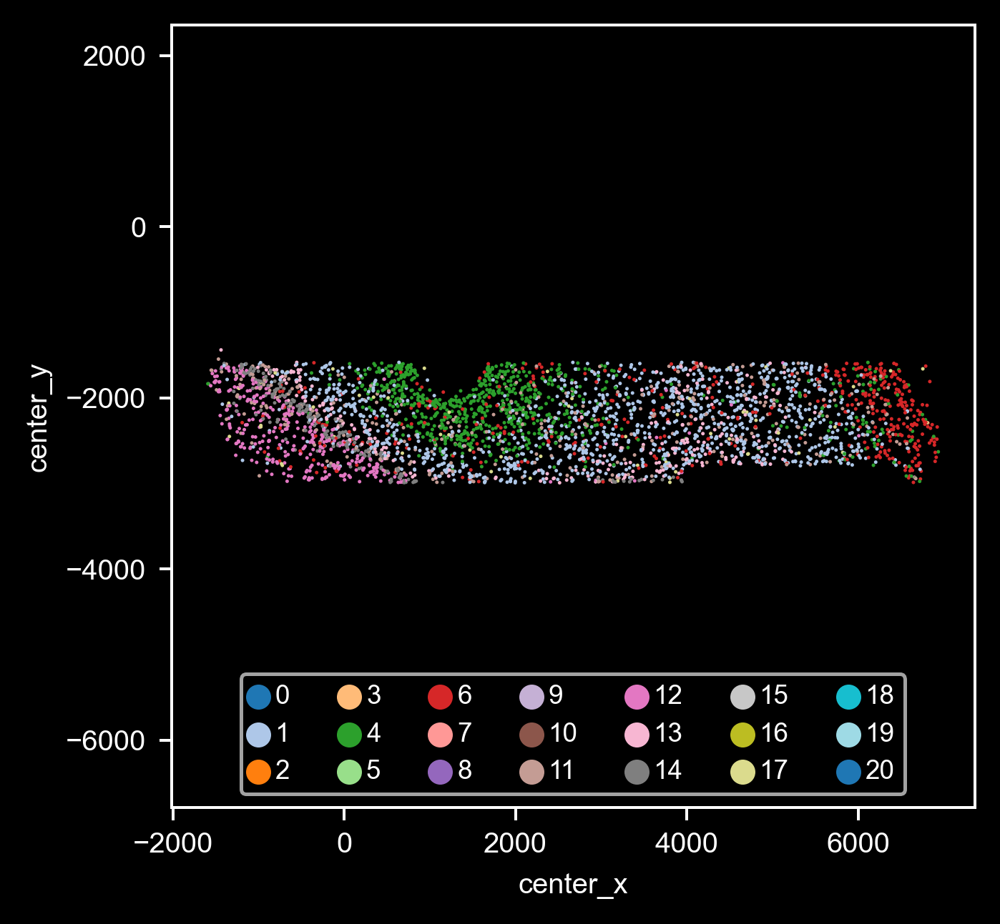

In [105]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
plt.style.use('dark_background')
#sel_clusters = ['0', '1', '2', '3', '4', '5']
sel_clusters = ['1', '4', '6', '11', '12', '13', '14', '17']# '3', '5', '7', '8', '11']
#sel_clusters = np.unique(adata.obs['leiden_cluster'])

sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if _cls in sel_clusters]
#ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
#                      color=[0.9,0.9,0.9], s=1, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=1, legend=True, linewidth=0)
ax.grid(False)
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=7, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
#plt.savefig(os.path.join(figure_folder, 'spatial_sel_clusters.png'), transparent=True)

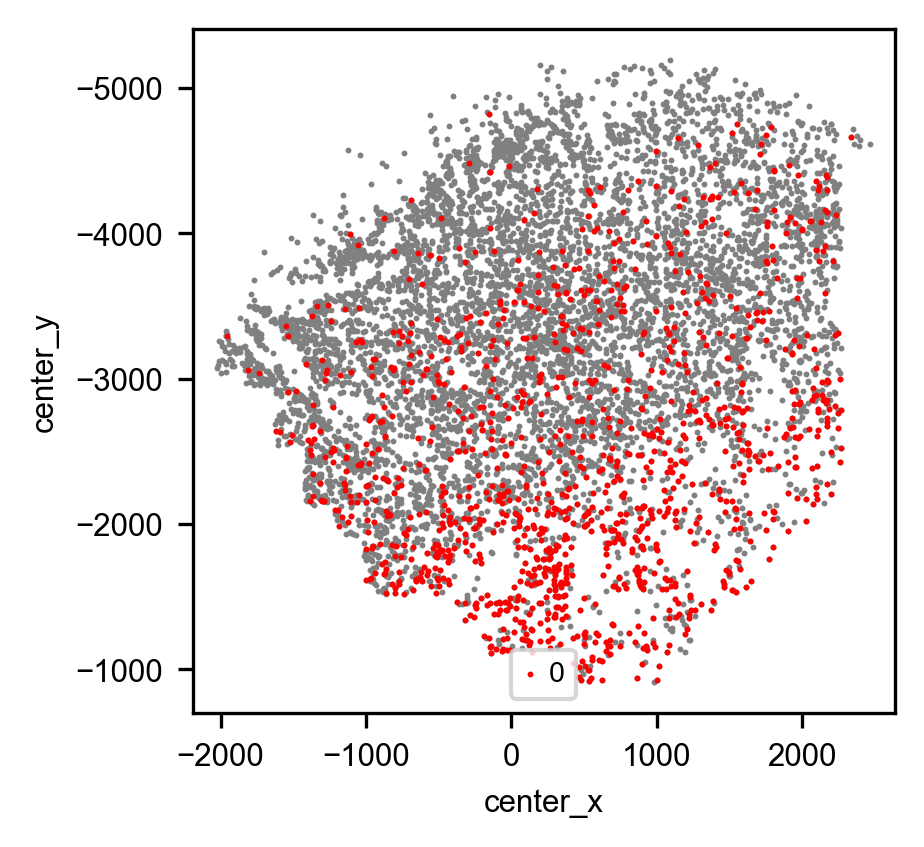

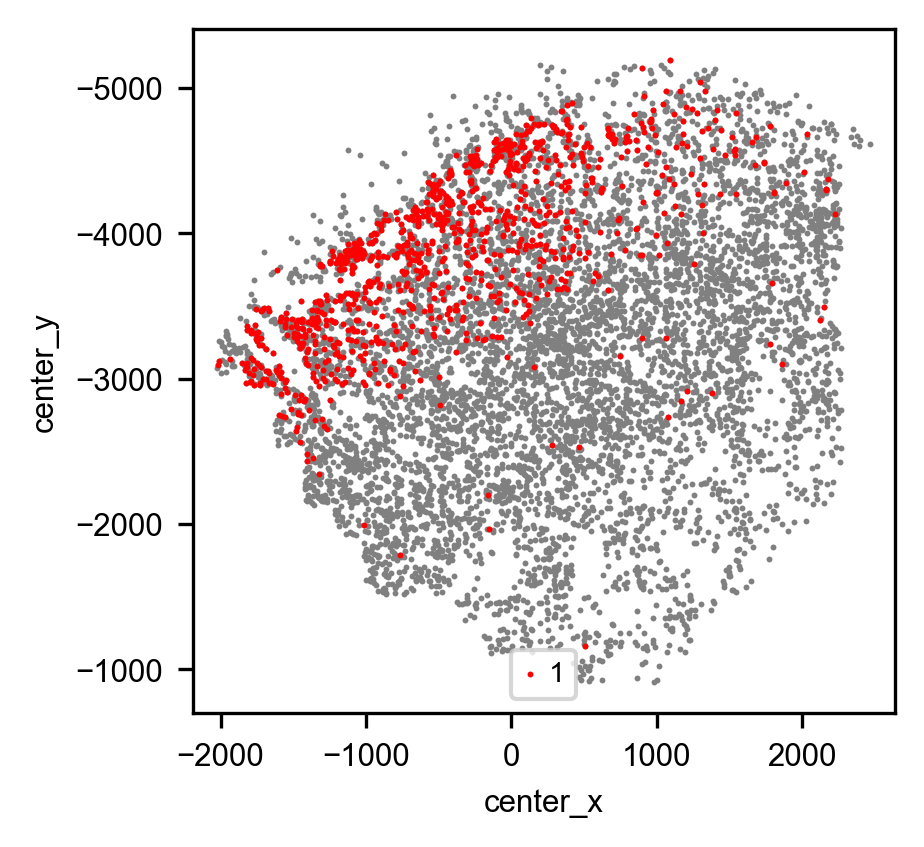

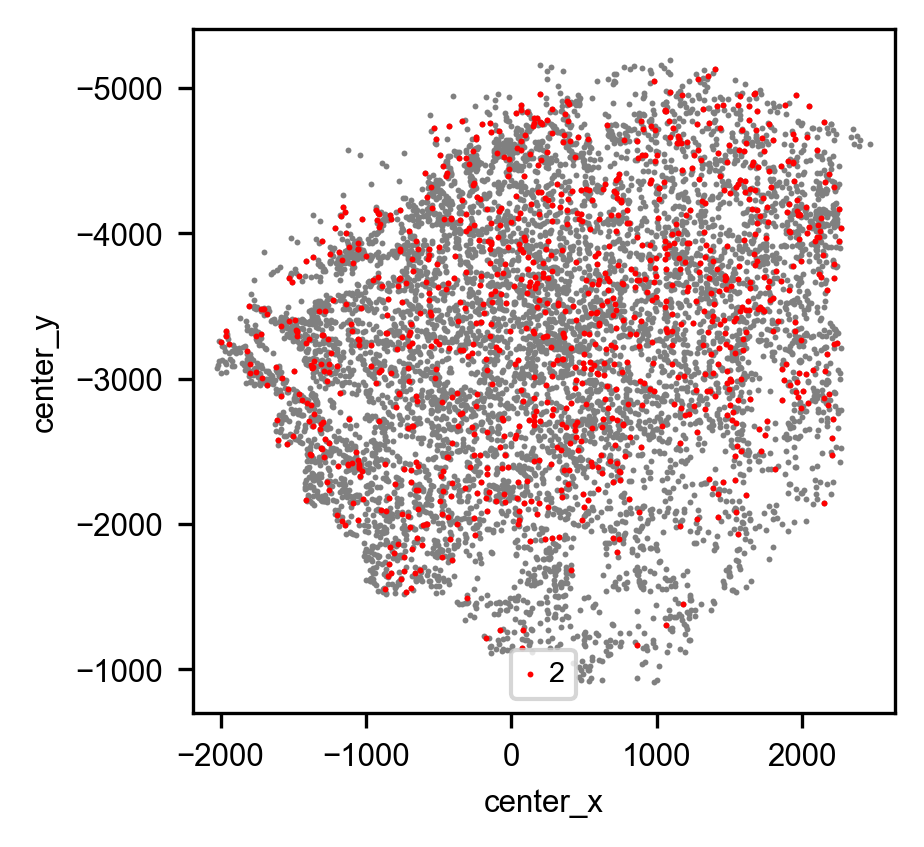

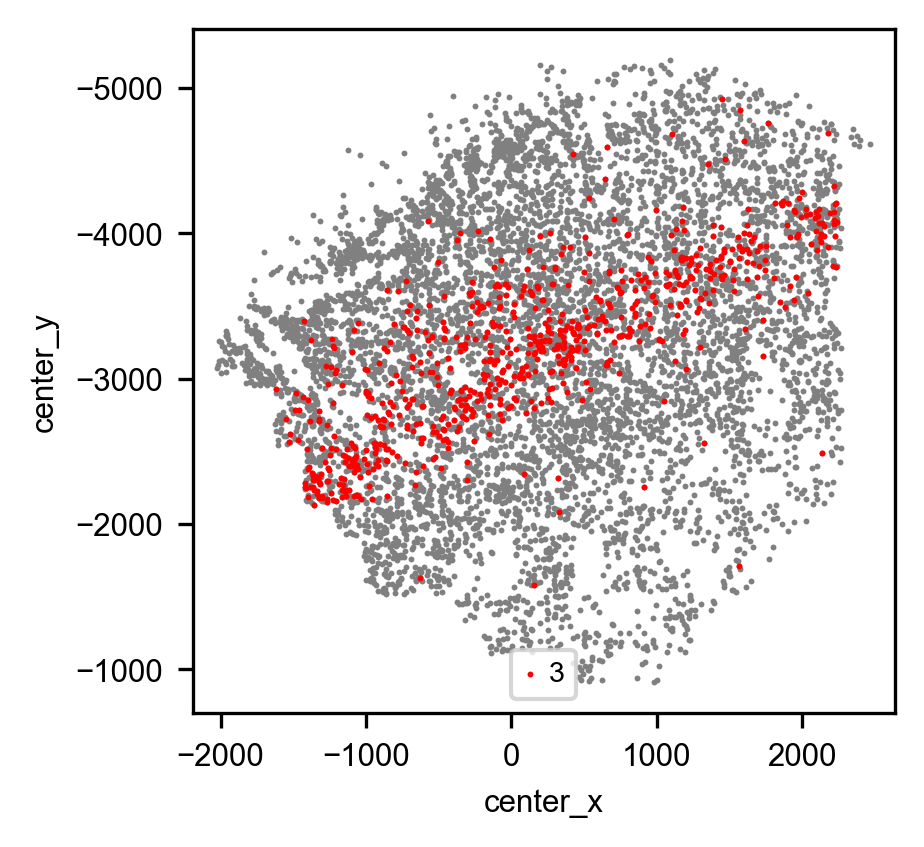

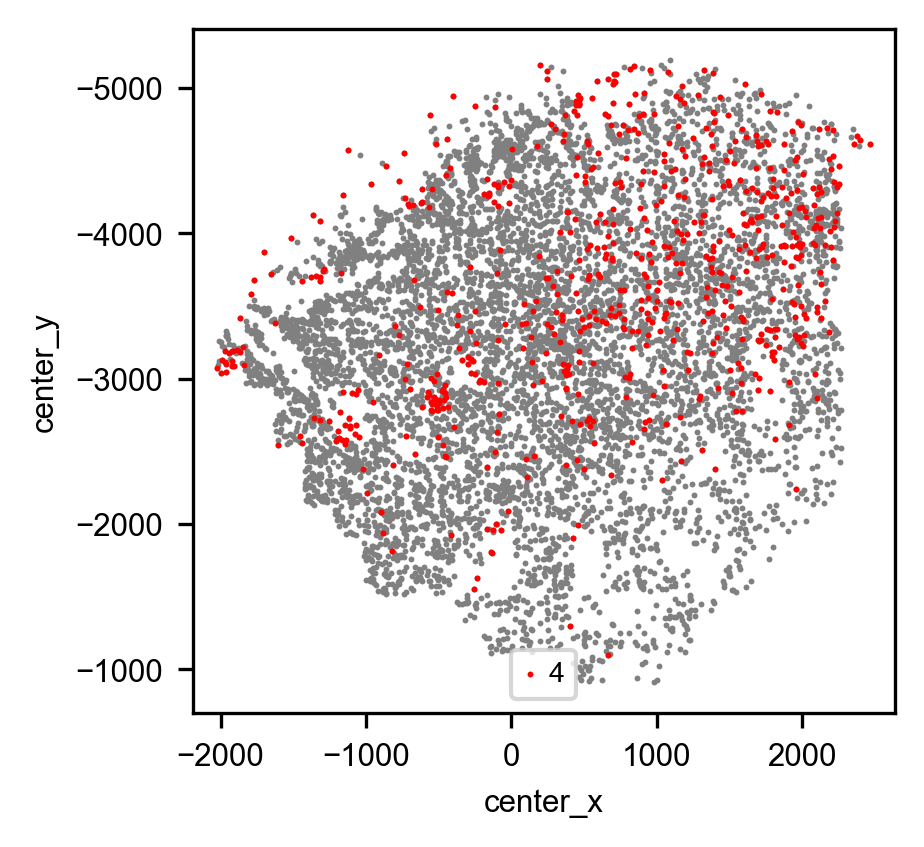

...

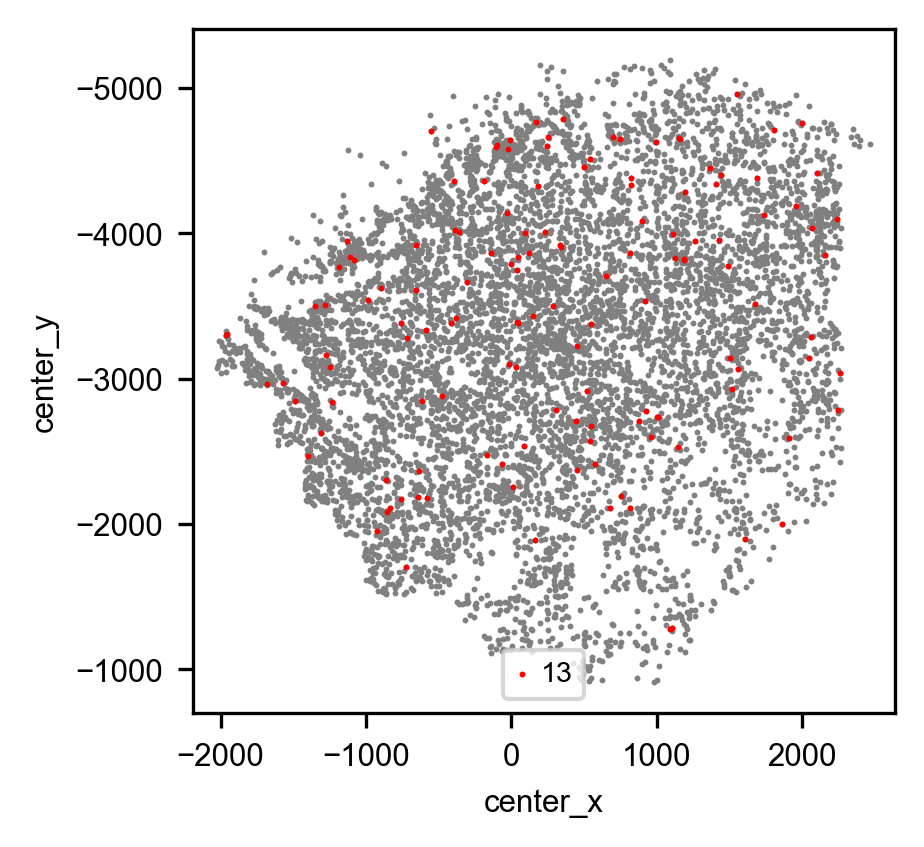

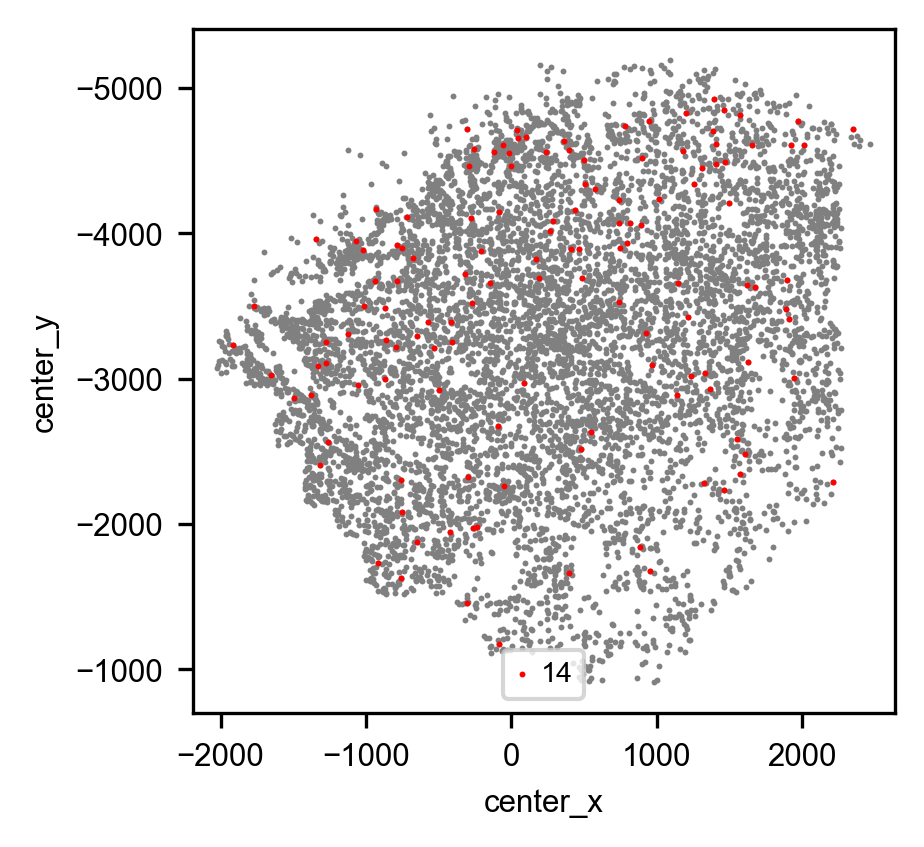

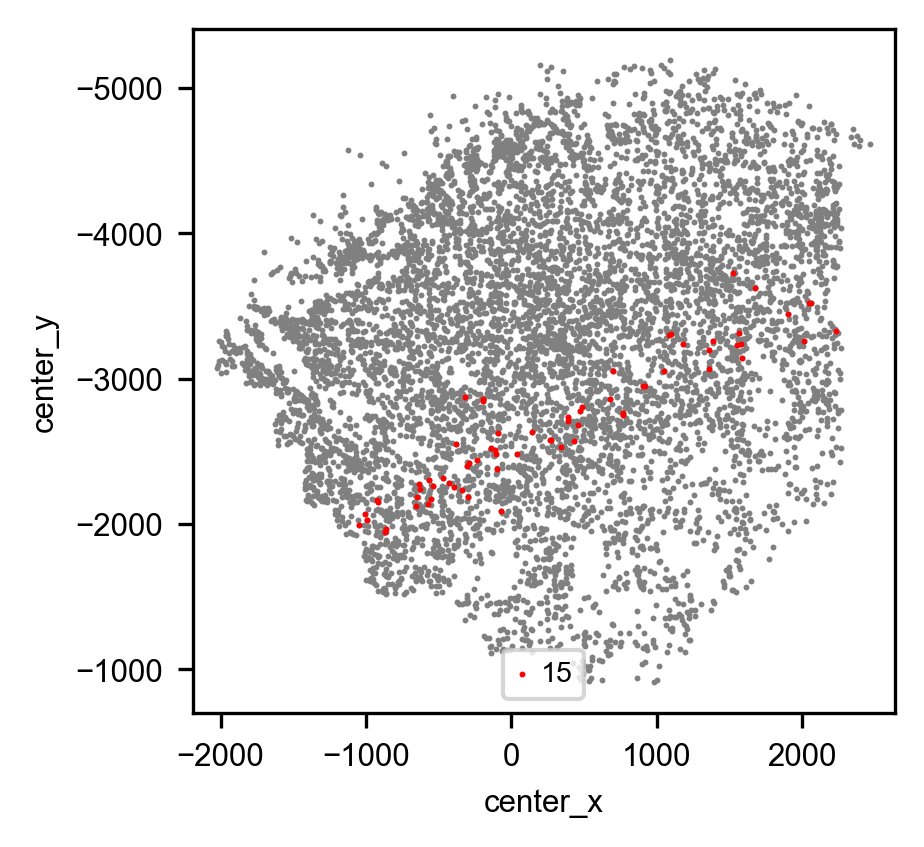

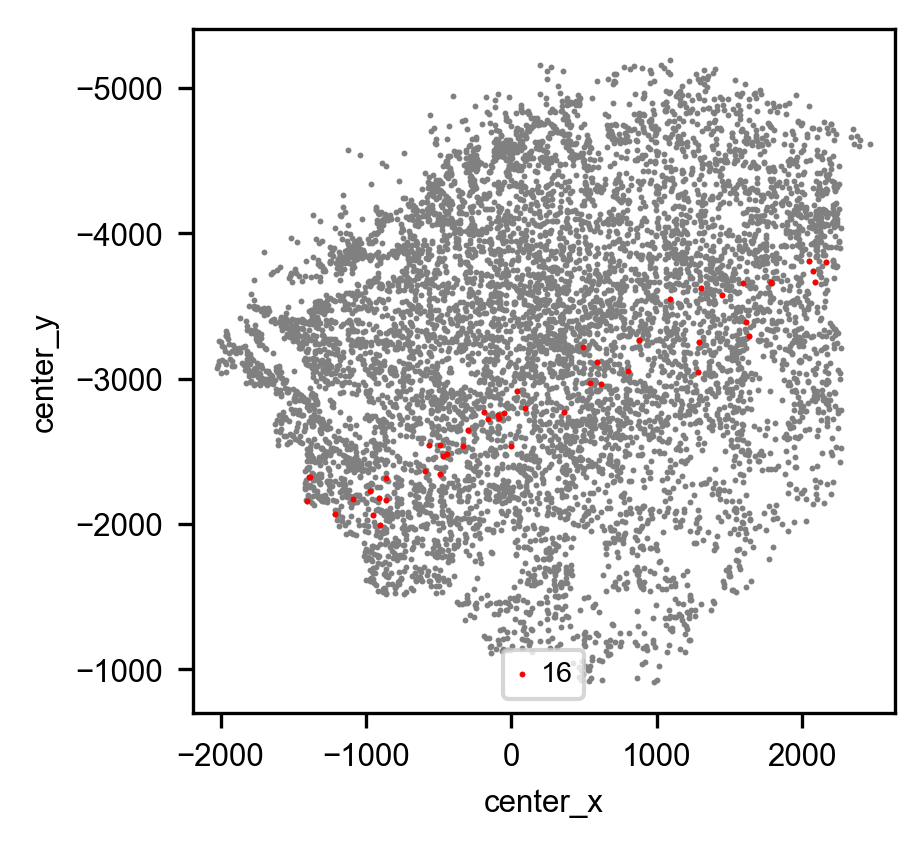

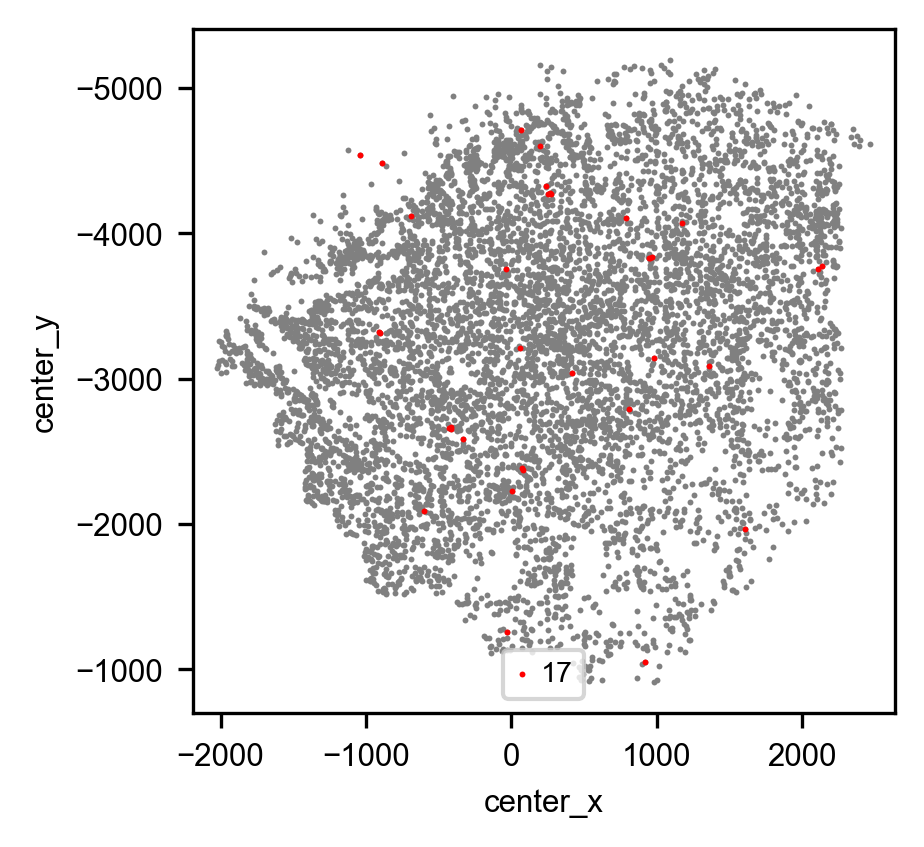

In [47]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
for _class in sorted(np.unique(adata.obs['leiden_cluster']), key=lambda v:int(v)):
    #plt.style.use('dark_background')
    ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                    color='grey', s=2, legend=True, linewidth=0)
    ax = sns.scatterplot(data=adata.obs.loc[adata.obs['leiden_cluster']==_class], 
                         x='center_x', y='center_y', 
                    color='r', s=2, legend=True, label=_class, linewidth=0)
    ax.grid(False)
    ax.invert_yaxis()
    plt.axis('equal')
    hs, ls = ax.get_legend_handles_labels()
    ax.legend(hs,ls, ncol=8, loc=8)
    plt.show()

In [107]:
sc.tl.rank_genes_groups(adata, groupby='leiden_cluster', method='t-test')
sc.pl.rank_genes_groups(adata, groupby='leiden_cluster')

E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py

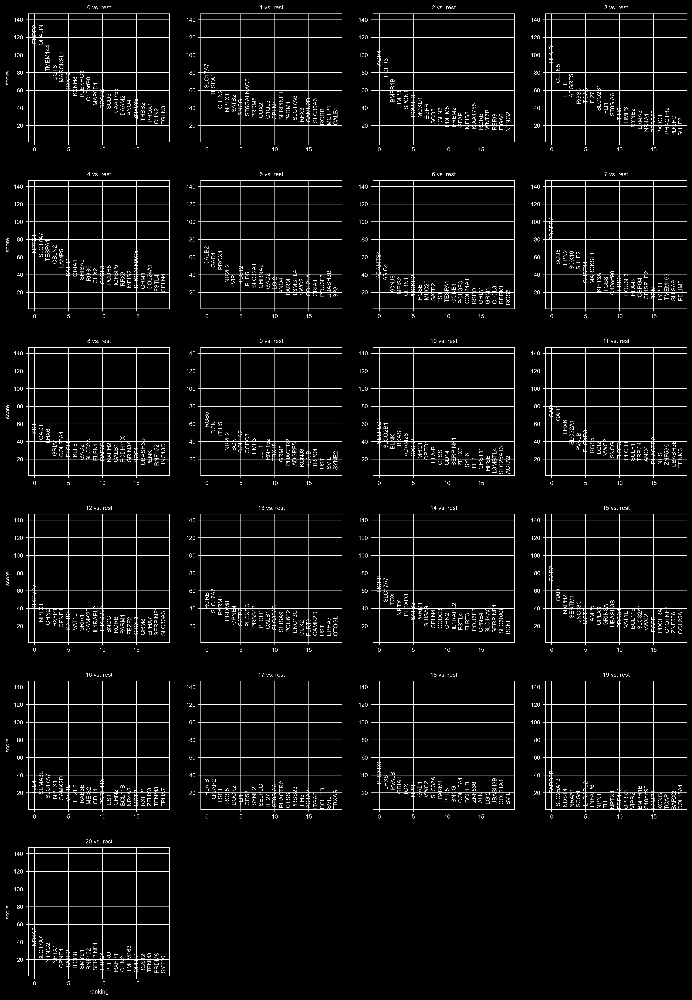

In [112]:
sc.pl.rank_genes_groups(adata, groupby='leiden_cluster')

In [137]:
np.array([list(_gnames) for _gnames in adata.uns['rank_genes_groups']['names']])[:1]

array([['ENPP2', 'SLC17A7', 'AQP4', 'HLA-B', 'NPTX1', 'CALB2', 'ADAMTS4',
        'PDGFRA', 'SST', 'RGS5', 'SELPLG', 'GAD1', 'SLC17A7', 'RORB',
        'RORB', 'GAD2', 'TLE4', 'HLA-B', 'PLCXD3', 'PARD3B', 'NR4A2']],
      dtype='<U10')

# 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [205]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = True

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: I:\MERFISH_Analysis\20221007-hMTG_hM1\PostAnalysis\filtered_cluster_data.h5ad


In [68]:
for _cls in np.unique(adata.obs['leiden_cluster']):
    mean_exp = df.iloc[np.where(adata.obs['leiden_cluster']==_cls)[0]].values.mean(0)
    print(_cls, df.columns[np.argsort(mean_exp)[:15]].values)

0 ['FNDC7' 'BARX2' 'CDCP1' 'NNMT' 'LYZL4' 'COL15A1' 'DOCK2' 'OSR1' 'TH'
 'ADAM2' 'COL14A1' 'LTF' 'CCDC80' 'RXFP2' 'CRISPLD2']
1 ['BARX2' 'FNDC7' 'RXFP1' 'LYZL4' 'LTF' 'CHODL' 'SLC17A8' 'SMYD1' 'CDCP1'
 'CCDC80' 'OSR1' 'TH' 'RXFP2' 'COL15A1' 'NPY']
10 ['LYZL4' 'CDCP1' 'FNDC7' 'RXFP2' 'ADAMTS2' 'C1QTNF7' 'ROR1' 'SLCO5A1'
 'COL15A1' 'BARX2' 'LTF' 'CORIN' 'ADAM2' 'NPSR1' 'SLC17A8']
11 ['ADAM2' 'VTN' 'CDCP1' 'BARX2' 'CORIN' 'FNDC7' 'LYZL4' 'NNMT' 'OSR1'
 'SLC17A8' 'RXFP2' 'CHODL' 'TH' 'LTF' 'COL15A1']
12 ['CDCP1' 'SLC17A8' 'BARX2' 'TUNAR' 'SMYD1' 'FNDC7' 'LTF' 'TH' 'ADAM2'
 'NPY' 'DOCK2' 'C1QTNF7' 'NNMT' 'COL14A1' 'COL15A1']
13 ['CDCP1' 'FNDC7' 'ADAM2' 'BARX2' 'SLC17A8' 'NNMT' 'GLRA1' 'COL14A1'
 'ENPP6' 'CHODL' 'OTOF' 'OSR1' 'RXFP2' 'PROK2' 'CCDC80']
14 ['CORIN' 'SLC17A8' 'IGFBP6' 'VTN' 'LYZL4' 'CHODL' 'LTF' 'COL15A1' 'CCDC80'
 'TRPC6' 'NNMT' 'RXFP2' 'PROK2' 'BARX2' 'ADAMTS2']
15 ['CD52' 'LTF' 'HPSE' 'COL25A1' 'NXPH2' 'SEMA3E' 'OPRK1' 'OTOF' 'OSR1'
 'NNMT' 'FNDC7' 'LYZL4' 'TBXAS1' 'ANKFN1' 